In [1]:
import os
import cv2
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### 导入数据

In [2]:
df_data = pd.read_csv('train.csv', header=None)
df_data.columns = ['image_id', 'class', 'label']
len(df_data)

79573

### 加载数据

In [3]:
def get_train_file(i, df_data):
    """
    Desc：筛选需要训练的图片信息（包括索引、服饰属性等）
    Params: 
        i: 共8类图片，i表示8类数据的索引
        df_data: 全部8类的图片信息（DataFrame 格式） 
    Return: 
        df_train: 筛选过后的第(i+1)类的图片信息（DataFrame 格式）
    """

    classes = ['collar_design_labels', 'neckline_design_labels', 'skirt_length_labels', 
               'sleeve_length_labels', 'neck_design_labels', 'coat_length_labels', 'lapel_design_labels', 
               'pant_length_labels']
    train_class = classes[i]
    df_train = df_data[(df_data['class'] == train_class)].copy()
    df_train.reset_index(inplace=True)
    del df_train['index']
    
    return df_train

df_train = get_train_file(0, df_data)

In [4]:
# print('数据个数: {0}'.format(len(df_train)))
# print(df_train[(df_train.index == 2)])
# df_train.head()

In [4]:
n_train = len(df_train)
n_class = len(df_train['label'][0])
width = height = 299 # Inception-ResNet V2 需要将原始图片放缩到(299, 299)

X = np.zeros((n_train, width, height, 3), dtype=np.uint8)
y = np.zeros((n_train, n_class), dtype=np.uint8)

for i in tqdm(range(n_train)):
    tmp_label = df_train['label'][i]
    if len(tmp_label) > n_class:
        print(df_train[i], "：不满足训练要求")
    img = cv2.imread('./train/{}'.format(df_train['image_id'][i]))
    
    X[i] = cv2.resize(img, (width, height)) 
    y[i][tmp_label.find('y')] += 1  

100%|██████████| 8393/8393 [01:53<00:00, 74.09it/s]


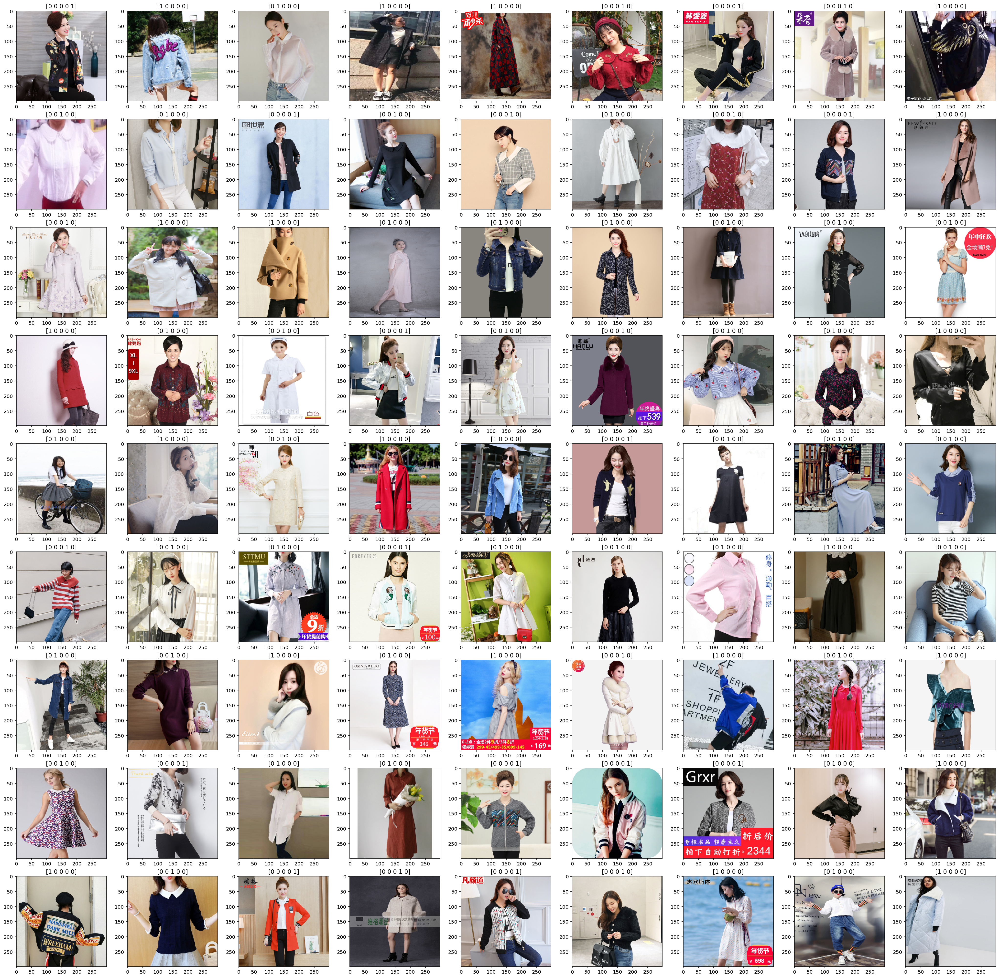

In [5]:
def grid_plot(n):
    """
    Desc:以n*n 以子图网格形式可视化训练集图片
    Param:
        n:网格每行每列的子图的数目
    """
    plt.figure(figsize=(n * 4, n * 4))
    for i in range(n * n):
        index = np.random.randint(0, n_train - 1)
        plt.subplot(n, n, i + 1)
        plt.imshow(X[index][:, :, ::-1])
        plt.title(y[index])

grid_plot(n = 9)

### 提取特征

In [6]:
import keras
from keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout, Lambda
from keras.models import Model
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam, rmsprop
from keras.preprocessing.image import ImageDataGenerator
# from keras.utils.vis_utils import plot_model

from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from keras.applications.resnet50 import ResNet50, preprocess_input

/home/jiang/.conda/envs/keras/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [7]:
base_model = InceptionResNetV2(include_top=False, input_shape=(width, width, 3), weights='imagenet')
inputs = Input((width, width, 3))

x = inputs
x = Lambda(preprocess_input, name='preprocessing')(x)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(n_class, activation='softmax', name='softmax')(x)

model = Model(inputs, x)
# plot_model(model,'./inception_ResNetV2_model.png')

### 划分训练、测试集

In [8]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.12, random_state=42)
X_train.shape, y_train.shape

((7385, 299, 299, 3), (7385, 5))

In [ ]:
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

datagen.fit(X_train)


adam = Adam(lr=0.001)
prefix_cls = df_train['class'][0].split('_')[0]

model.compile(optimizer=adam,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

checkpointer = ModelCheckpoint(filepath='./models/inception_resnetv2/{0}.best.h5'.format(prefix_cls), verbose=1, 
                               save_best_only=True)

h = model.fit_generator(
              datagen.flow(X_train, y_train, batch_size=32),
              steps_per_epoch=len(X_train),
              epochs=80, 
              callbacks=[EarlyStopping(patience=3), checkpointer], 
              shuffle=True, 
              validation_data=(X_valid, y_valid))

Text(0.5,0,'epoch')

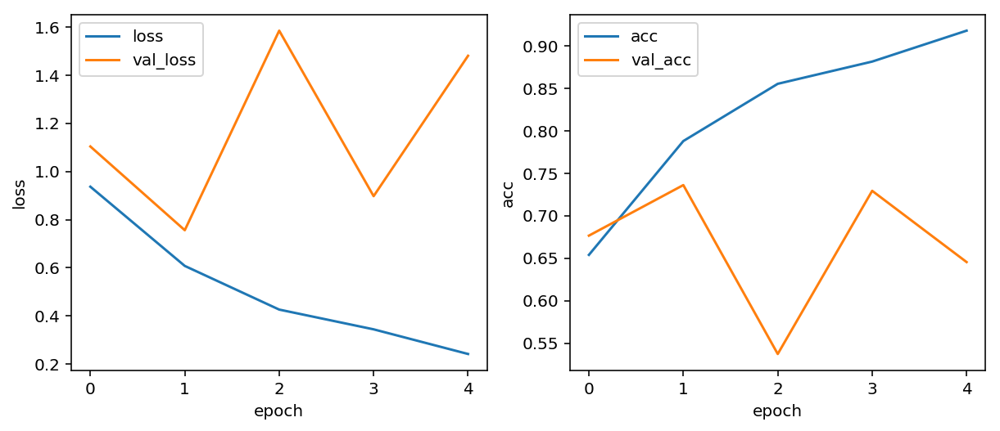

In [12]:
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(h.history['loss'])
plt.plot(h.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')

plt.subplot(1, 2, 2)
plt.plot(h.history['acc'])
plt.plot(h.history['val_acc'])
plt.legend(['acc', 'val_acc'])
plt.ylabel('acc')
plt.xlabel('epoch')

In [14]:
model.evaluate(X_train, y_train, batch_size=256)

7385/7385 [==============================] - 62s 8ms/step


[0.7887161796288307, 0.7599187538037853]

In [15]:
model.evaluate(X_valid, y_valid, batch_size=256)

1008/1008 [==============================] - 9s 9ms/step


[1.4538595203369382, 0.6448412698412699]

### 加载测试集

In [16]:
df_test = pd.read_csv('test_a.csv', header=None)
df_test.columns = ['image_id', 'class', 'x']
del df_test['x']
df_test.head()

,image_id,class
0,Images/collar_design_labels/60951f5761ea3a01d6...,collar_design_labels
1,Images/collar_design_labels/677e1183282769a3fe...,collar_design_labels
2,Images/collar_design_labels/3f5a2be205e5d253eb...,collar_design_labels
3,Images/collar_design_labels/1712bf3d7b57d779ad...,collar_design_labels
4,Images/collar_design_labels/0b2b4254f35ce3a41a...,collar_design_labels


In [17]:
df_train = df_test[(df_test['class'] == cur_class)].copy()
df_train.reset_index(inplace=True)
del df_train['index']

print('{0}: {1}'.format(cur_class, len(df_train)))
df_train.head()

collar_design_labels: 1082


,image_id,class
0,Images/collar_design_labels/60951f5761ea3a01d6...,collar_design_labels
1,Images/collar_design_labels/677e1183282769a3fe...,collar_design_labels
2,Images/collar_design_labels/3f5a2be205e5d253eb...,collar_design_labels
3,Images/collar_design_labels/1712bf3d7b57d779ad...,collar_design_labels
4,Images/collar_design_labels/0b2b4254f35ce3a41a...,collar_design_labels


In [18]:
n = len(df_train)
X_test = np.zeros((n, width, width, 3), dtype=np.uint8)

for i in tqdm(range(n)):
    X_test[i] = cv2.resize(cv2.imread('./test_a/{0}'.format(df_train['image_id'][i])), (width, width))

100%|██████████| 1082/1082 [00:04<00:00, 265.47it/s]


In [19]:
test_np = model.predict(X_test, batch_size=256)

In [20]:
test_np.shape

(1082, 5)

In [21]:
result = []

for i, row in df_train.iterrows():
    tmp_list = test_np[i]
    tmp_result = ''
    for tmp_ret in tmp_list:
        tmp_result += '{:.4f};'.format(tmp_ret)
        
    result.append(tmp_result[:-1])

df_train['result'] = result
df_train.head()

,image_id,class,result
0,Images/collar_design_labels/60951f5761ea3a01d6...,collar_design_labels,0.0008;0.9845;0.0005;0.0141;0.0001
1,Images/collar_design_labels/677e1183282769a3fe...,collar_design_labels,0.0000;0.0000;0.0000;1.0000;0.0000
2,Images/collar_design_labels/3f5a2be205e5d253eb...,collar_design_labels,0.0000;0.9998;0.0000;0.0002;0.0000
3,Images/collar_design_labels/1712bf3d7b57d779ad...,collar_design_labels,0.0056;0.0004;0.0087;0.9846;0.0007
4,Images/collar_design_labels/0b2b4254f35ce3a41a...,collar_design_labels,0.0000;0.0000;0.0002;0.9998;0.0000


In [22]:
df_train.to_csv('./result/{}_0307a.csv'.format(prefix_cls), header=None, index=False)
prefix_cls

'collar'